<a href="https://colab.research.google.com/github/ulya1202/Computer_vision_projects/blob/main/Fruits_and_Vegetables_Image_Recognition_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot  as plt
import matplotlib.image as mpimg
import random
import pathlib
import shutil
import collections
import cv2
from sklearn.metrics import confusion_matrix,classification_report

In [ ]:
# !pip install keras-cv

In [ ]:


# os.environ["KERAS_BACKEND"] = "tensorflow"
# import keras
# import keras_cv
# from keras import ops
# from keras import layers
# import tensorflow as tf
# import numpy as np
# import matplotlib.pyplot as plt
# import tensorflow_datasets as tfds

In [ ]:
!curl -L -o fruit-and-vegetable-image-recognition.zip  https://www.kaggle.com/api/v1/datasets/download/kritikseth/fruit-and-vegetable-image-recognition

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
 30 2032M   30  612M    0     0  20.2M      0  0:01:40  0:00:30  0:01:10 21.3M^C


In [ ]:
import tensorflow as tf

In [ ]:
!unzip /content/fruit-and-vegetable-image-recognition.zip

Archive:  /content/fruit-and-vegetable-image-recognition.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/fruit-and-vegetable-image-recognition.zip or
        /content/fruit-and-vegetable-image-recognition.zip.zip, and cannot find /content/fruit-and-vegetable-image-recognition.zip.ZIP, period.


# Function

## EDA functions

In [ ]:
def view_image_random(target_path,target_name):
    #target path + target name==> folder
    folder_fruit=os.path.join(target_path, target_name)
    this_fruit_imgs=os.listdir(folder_fruit)
    this_fruit_img=random.sample(this_fruit_imgs, 1)
    path_this_fruit_img=os.path.join(folder_fruit,this_fruit_img[0])
    img=mpimg.imread(path_this_fruit_img)
    plt.imshow(img) #!!!!!!!
    plt.axis('off')
    plt.title(f'{target_name}')

In [ ]:
def view_image_full_random(target_path,target_name,n=0):

    dir=os.path.join(target_path, target_name)
    samples=os.listdir(dir)
    defa=len(samples)
    if n==0:
        n=defa
        list_random=samples
    else:
        list_random=random.sample(samples, n)
    plt.figure(figsize=(25,25))
    plt.tight_layout()
    for i in range(n):
        im_p=os.path.join(dir,list_random[i])
        img=mpimg.imread(im_p)
        plt.subplot(int(np.ceil(n**0.5)), int(np.ceil(n**0.5)),i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'{target_name}')

In [ ]:
def plot_dist(path_of_dir, color='skyblue'):
    n=path_of_dir
    dir_name=dict()
    dir_name_x={}

    for cur_dir_path, dirname, files in os.walk(n):
        dir_name[os.path.basename(cur_dir_path)]=len(files)
        dir_name_x[os.path.basename(cur_dir_path)]=files

    data=pd.DataFrame.from_dict(data=dir_name, orient='index',columns=['count'])
    plt.bar(data.index, height=data['count'],color=color)
    plt.xticks(rotation=90);
    return data

In [ ]:
def view_image_full_2__random(target_path):
    target_names=os.listdir(target_path)
    n=len(target_names)
    plt.figure(figsize=(20,25))
    plt.tight_layout()
    for i in range(len(target_names)):

        dir=os.path.join(target_path, target_names[i])
        samples=os.listdir(dir)
        random_s=random.sample(samples,1)
        img_path=os.path.join(dir, random_s[0])

        plt.subplot(int(np.ceil(n**0.5)),int(np.ceil(n**0.5)),i+1)
        img=mpimg.imread(img_path)
        plt.imshow(img)
        plt.title(f'{target_names[i]}')
        plt.axis('off')
    plt.show()





In [ ]:

def shape_find(path_main):
    classes=os.listdir(path_main)
    belove_3=set()
    dis=collections.defaultdict(list)
    dis_3=set()
    none_set=set()

    for cls in classes:
        imclg=os.path.join(path_main,cls)
        files=os.listdir(imclg)
        for fi in files:
            n_p=os.path.join(imclg,fi)
            img=cv2.imread(n_p, cv2.IMREAD_UNCHANGED)
            if img is None:
                none_set.add(n_p)
            elif img.ndim!=3:
                belove_3.add(n_p)
            else:
                x,y,z=img.shape
                dis['h']+=[x]
                dis['w']+=[y]
                dis['z']+=[z]
                if z!=3:
                    dis_3.add(n_p)

    return belove_3, dis, dis_3, none_set








## Aug func

## FAlse Pred

In [ ]:
def plot_pred_falses(test, y_pred, y_true):
  worng_idx=np.where(y_true!=y_pred)[0]
  X = np.concatenate([x for x, y in test], axis=0)
  plt.figure(figsize=(15,15))
  for i,idx in  enumerate(worng_idx):
    plt.subplot(int(np.ceil(len(worng_idx)**0.5)),int(np.ceil(len(worng_idx)**0.5)),i+1)
    plt.imshow(X[idx].astype('uint8'))
    plt.title(f'true:{classes[y_true[idx]]}, pred:{classes[y_pred[idx]]}')
    plt.axis('off')

In [ ]:
def aug_plot(data, aug,classes):
    for input,output in data.take(1):
        aug_x=aug(input)
        plt.figure(figsize=(20,20))
        plt.tight_layout()

        for i in range(len(input)):
            plt.subplot(int(np.ceil(len(input)**0.5)),int(np.ceil(len(input)**0.5)),i+1)
            plt.imshow(aug_x[i].numpy().astype("uint8"))
            plt.title(f'{classes[np.argmax(output[i])]}')
            plt.axis('off')
        plt.show()

# EDA

In [ ]:
#dirname
train_p='/content/train'
n=os.walk(train_p)
next(n)
next(n)
next(n)



('/content/train/raddish',
 [],
 ['Image_57.jpg',
  'Image_64.jpg',
  'Image_99.jpg',
  'Image_5.jpg',
  'Image_63.jpg',
  'Image_55.jpg',
  'Image_32.jpg',
  'Image_69.jpg',
  'Image_67.jpg',
  'Image_84.jpg',
  'Image_26.jpg',
  'Image_30.JPG',
  'Image_27.jpg',
  'Image_16.jpg',
  'Image_40.jpg',
  'Image_6.jpg',
  'Image_36.jpg',
  'Image_1.jpg',
  'Image_52.jpg',
  'Image_18.jpg',
  'Image_8.jpeg',
  'Image_68.jpg',
  'Image_24.JPG',
  'Image_7.jpg',
  'Image_88.png',
  'Image_56.jpg',
  'Image_42.jpg',
  'Image_28.jpg',
  'Image_44.jpg',
  'Image_66.jpg',
  'Image_71.png',
  'Image_59.png',
  'Image_98.jpg',
  'Image_78.jpg',
  'Image_50.jpg',
  'Image_75.jpg',
  'Image_41.jpg',
  'Image_48.png',
  'Image_35.jpg',
  'Image_12.jpg',
  'Image_29.jpg',
  'Image_14.jpg',
  'Image_4.jpg',
  'Image_37.jpg',
  'Image_45.jpg',
  'Image_43.jpg',
  'Image_97.jpg',
  'Image_72.jpg',
  'Image_91.jpg',
  'Image_39.jpg',
  'Image_49.jpg',
  'Image_89.jpg',
  'Image_10.jpg',
  'Image_2.jpg',
  

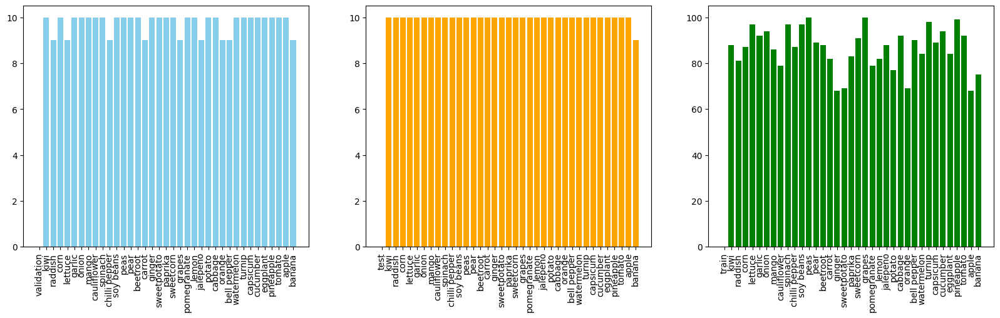

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
val_da_di=plot_dist('/content/validation')
plt.subplot(1,3,2)
test_di=plot_dist('/content/test','orange')
plt.subplot(1,3,3)
train_di=plot_dist('/content/train','green')


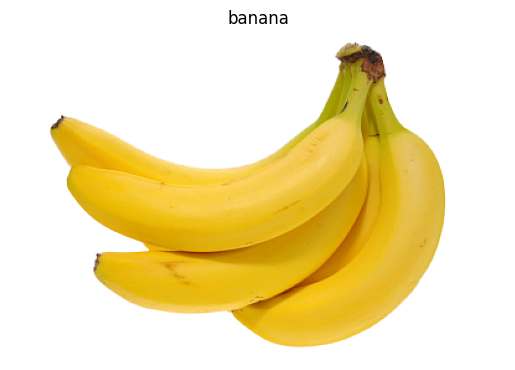

In [ ]:
view_image_random('/content/train','banana')

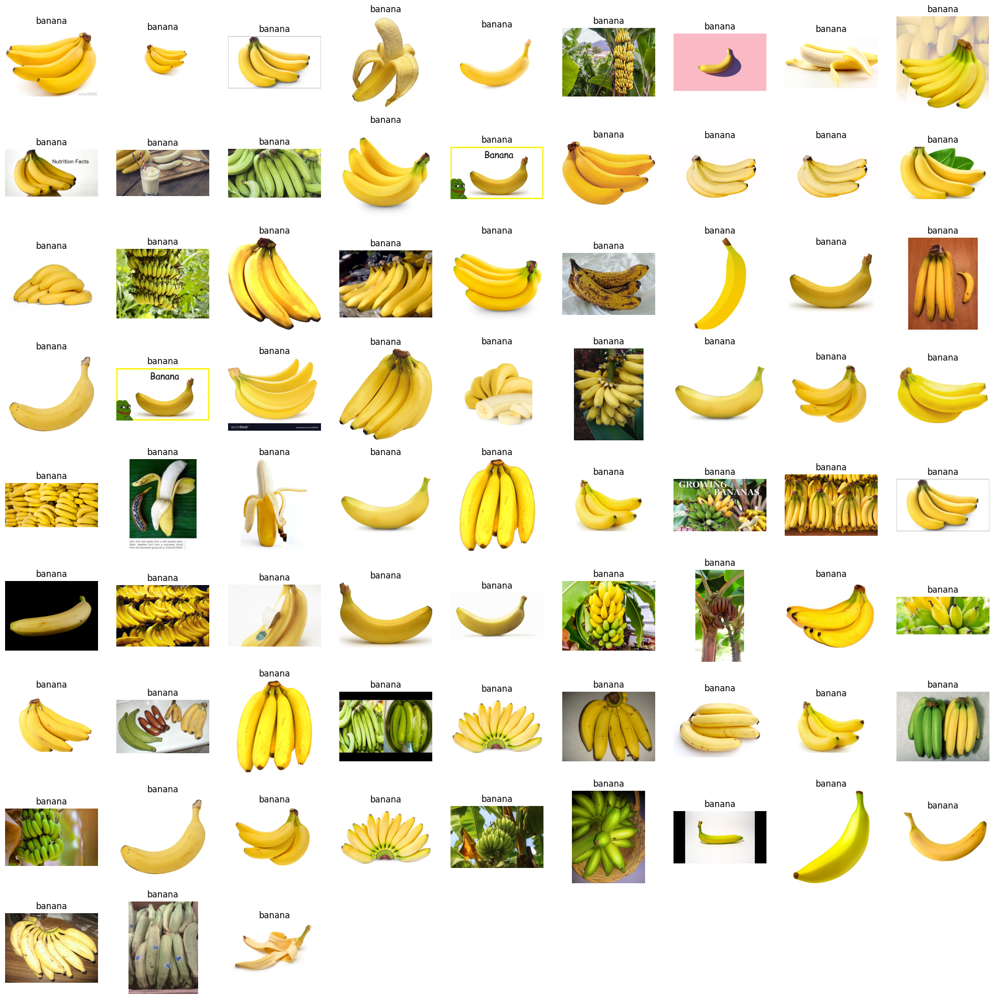

In [ ]:
view_image_full_random('/content/train','banana',)

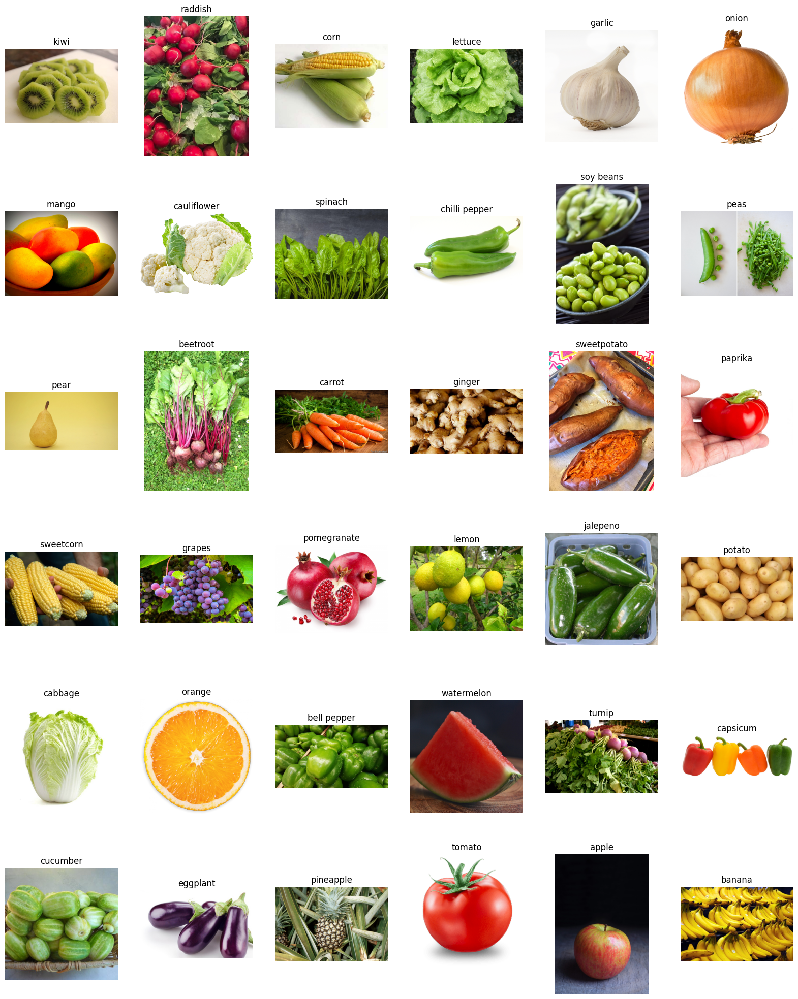

In [ ]:
view_image_full_2__random('/content/train')

In [ ]:
x,y,z,n=shape_find(train_p)


In [ ]:
print(f'none typ:{n}')

none typ:{'/content/train/bell pepper/Image_56.jpg'}


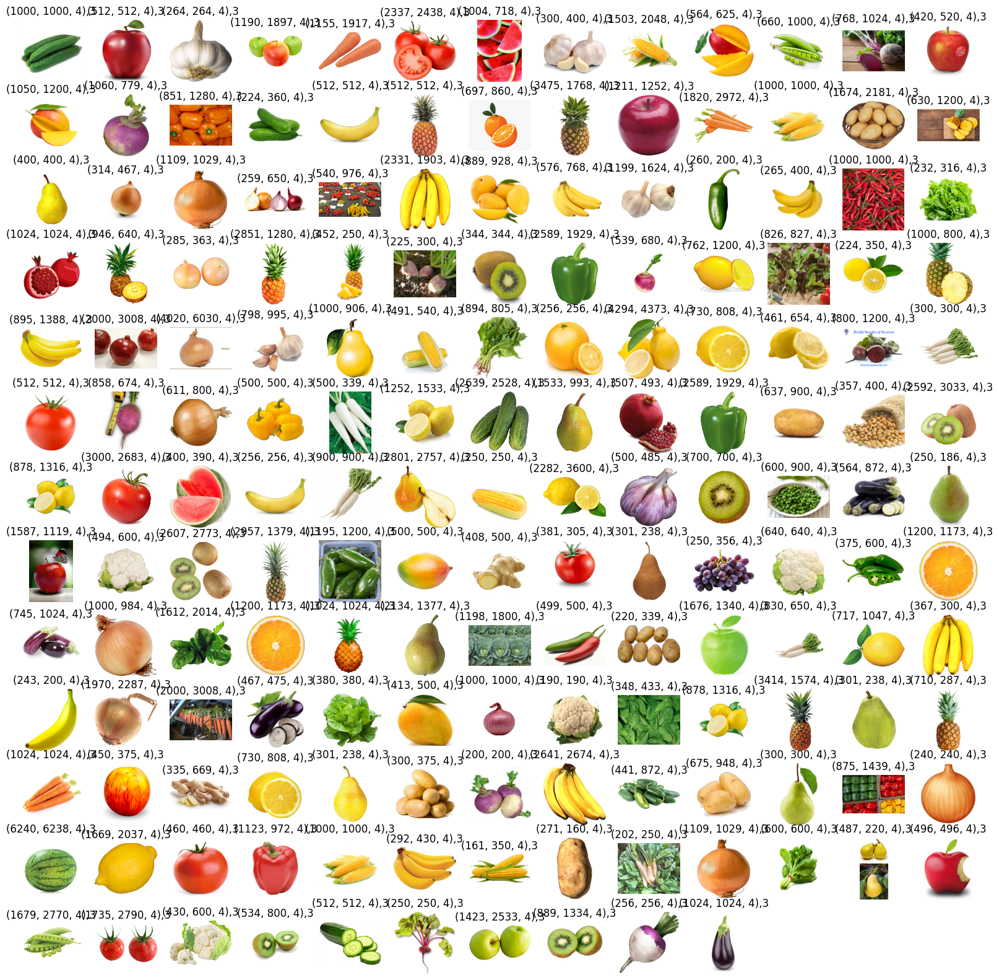

In [ ]:
plt.figure(figsize=(20,20))
for i,img_p in enumerate(z):

    img=mpimg.imread(img_p)
    plt.subplot(int(np.ceil(len(z)**0.5)),int(np.ceil(len(z)**0.5)),i+1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'{img.shape},{img.ndim}')

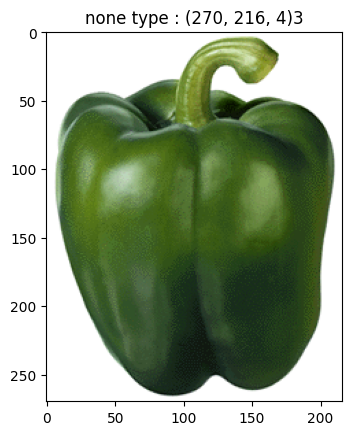

In [ ]:
for i in n:
    old_path=i
    img=mpimg.imread(i)
    plt.imshow(img)
    plt.title(f'none type : {img.shape}{img.ndim}',)

In [ ]:
pd.DataFrame(y).loc[pd.DataFrame(y)['z']!=3]

,h,w,z
15,534,800,4
28,2592,3033,4
49,2607,2773,4
58,344,344,4
73,700,700,4
...,...,...,...
3079,2331,1903,4
3093,576,768,4
3095,367,300,4
3104,265,400,4


# Load

In [ ]:
train_path='/content/train'
val_path='/content/validation'
test_path='/content/test'



In [ ]:
IMG_SIZE=(256,256)
batch_size=32

In [ ]:
train_data=tf.keras.preprocessing.image_dataset_from_directory(
    train_path,
    label_mode='categorical',
    # class_names=classes,
    color_mode='rgb',
    batch_size=batch_size,
    image_size=IMG_SIZE,
    seed=42,

)

val_data=tf.keras.preprocessing.image_dataset_from_directory(
    val_path,
    label_mode='categorical',
    # class_names=classes,
    color_mode='rgb',
    batch_size=batch_size,
    image_size=IMG_SIZE,
    seed=42,

)

test_data=tf.keras.preprocessing.image_dataset_from_directory(
    test_path,
    label_mode='categorical',
    # class_names=classes,
    color_mode='rgb',
    batch_size=batch_size,
    image_size=IMG_SIZE,
    seed=42,

)

Found 3115 files belonging to 36 classes.
Found 351 files belonging to 36 classes.
Found 359 files belonging to 36 classes.


In [ ]:
classes=train_data.class_names

In [ ]:
train_data.element_spec,test_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 36), dtype=tf.float32, name=None)),
 (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 36), dtype=tf.float32, name=None)),
 (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 36), dtype=tf.float32, name=None)))

In [ ]:
train=train_data.cache().shuffle(1000).prefetch(tf.data.AUTOTUNE)
val=val_data.cache().prefetch(tf.data.AUTOTUNE)
test=test_data.cache().prefetch(tf.data.AUTOTUNE)
train_test=train_data.cache().prefetch(tf.data.AUTOTUNE)

# Aug

In [ ]:
# rand_augment = keras_cv.layers.RandAugment(
#     value_range=(0, 255), augmentations_per_image=3, magnitude=1
# )

In [ ]:
aug=tf.keras.Sequential([
    tf.keras.layers.RandomZoom(0.2),
    tf.keras.layers.RandomBrightness(0.2),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomContrast(0.1)

])

## Plot

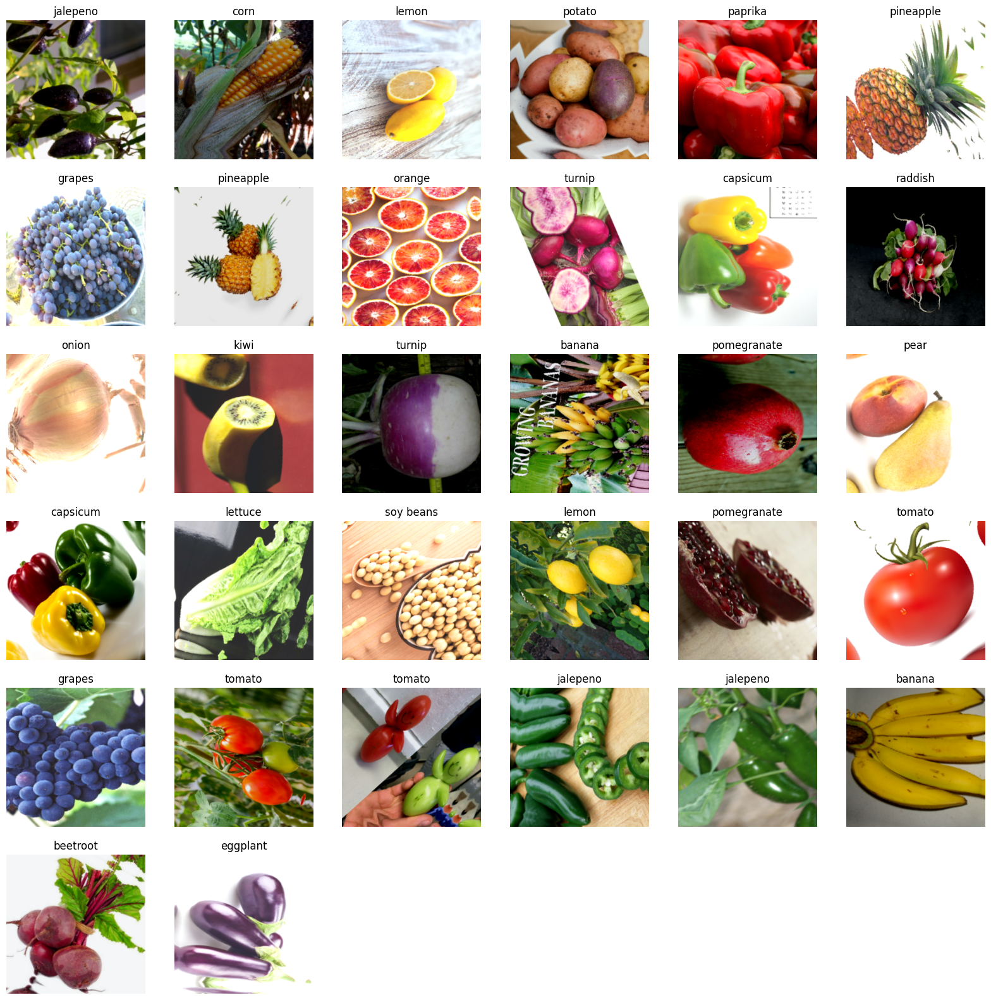

In [ ]:
aug_plot(train, aug,classes)

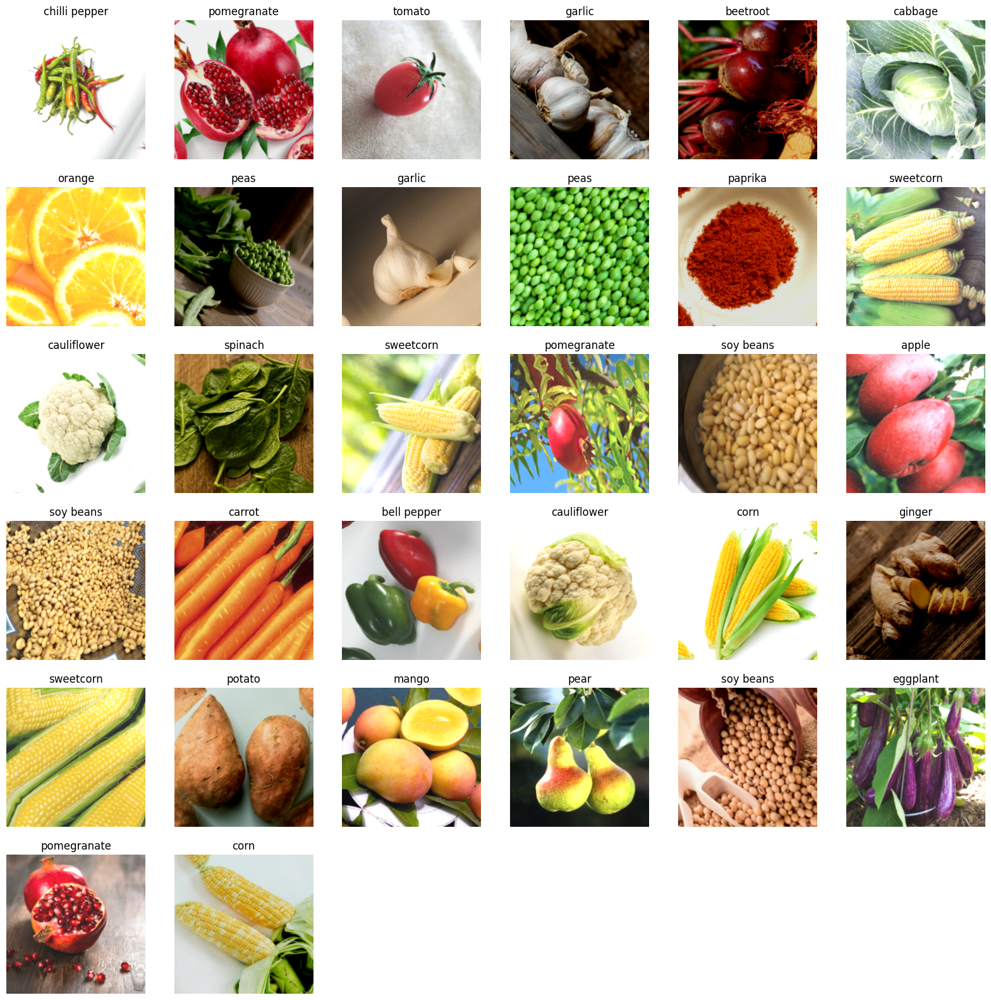

In [ ]:
aug_plot(val, aug,classes)

# Transfer Learning


In [ ]:
#Efficcient
input_l=tf.keras.layers.Input(shape=(256,256,3))
aug_l=aug(input_l)
x=tf.keras.layers.Lambda(tf.keras.applications.efficientnet.preprocess_input)(aug_l)
base_model=tf.keras.applications.EfficientNetB5(include_top=False, input_tensor=x)
base_model.trainable=False
ga=tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output=tf.keras.layers.Dense(units=len(classes),activation='sigmoid')(ga)

model=tf.keras.Model(inputs=input_l, outputs=output)

# model check points

In [ ]:
# f1_metric = tf.keras.metrics.F1Score(average=)
f1 = tf.keras.metrics.F1Score( average='weighted', name='f1_w')

In [ ]:
initial_learning_rate = 0.01
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=100,
    decay_rate=0.96)

In [ ]:
path_k='/content/drive/MyDrive/check_point_extra.keras'
checkpoint_cb =tf.keras.callbacks.ModelCheckpoint(path_k,
    monitor='val_loss',#lazim gelse f1 e de bax
    verbose=0,
    save_best_only=True,
    save_weights_only=False,
    mode='auto',#f1 olanda max
    # save_freq='epoch',
    initial_value_threshold=None
)



In [ ]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=10,restore_best_weights=True)
# history = model.fit([...], callbacks=[checkpoint_cb, early_stopping_cb])

#MOdel compile and fit

In [ ]:
optimizer_n=tf.keras.optimizers.Nadam(
    learning_rate=lr_schedule)

In [ ]:
model.compile(optimizer=optimizer_n,loss='categorical_crossentropy',metrics=['accuracy',f1,])

In [ ]:
history=model.fit(train, epochs=100, verbose='auto',
                  callbacks=[checkpoint_cb,early_stopping_cb] ,validation_data=val)

Epoch 1/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 36s 370ms/step - accuracy: 0.9523 - f1_w: 0.9544 - loss: 0.1371 - val_accuracy: 0.9288 - val_f1_w: 0.9285 - val_loss: 0.1291
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 35s 357ms/step - accuracy: 0.9461 - f1_w: 0.9468 - loss: 0.1398 - val_accuracy: 0.9288 - val_f1_w: 0.9196 - val_loss: 0.1675
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 35s 354ms/step - accuracy: 0.9479 - f1_w: 0.9493 - loss: 0.1214 - val_accuracy: 0.9430 - val_f1_w: 0.9336 - val_loss: 0.1459
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 35s 361ms/step - accuracy: 0.9565 - f1_w: 0.9553 - loss: 0.1086 - val_accuracy: 0.9430 - val_f1_w: 0.9253 - val_loss: 0.1342
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 40s 355ms/step - accuracy: 0.9627 - f1_w: 0.9591 - loss: 0.1075 - val_accuracy: 0.9544 - val_f1_w: 0.9403 - val_loss: 0.1385
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 35s 356ms/step - accuracy: 0.9583 - f1_w: 0.9592 - loss: 0.1270 - val_accuracy: 0.9373 - val_f1_w: 0.9346 - val_loss: 0.1084
Epoch 7/100
98/9

In [ ]:
model.load_weights('/content/drive/MyDrive/check_point3.keras')

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'nadam', because it has 1 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
model.evaluate(test),model.evaluate(val),model.evaluate(train)

12/12 ━━━━━━━━━━━━━━━━━━━━ 24s 469ms/step - accuracy: 0.9795 - f1_w: 0.9778 - loss: 0.0640
11/11 ━━━━━━━━━━━━━━━━━━━━ 9s 766ms/step - accuracy: 0.9658 - f1_w: 0.9633 - loss: 0.0785
98/98 ━━━━━━━━━━━━━━━━━━━━ 85s 290ms/step - accuracy: 0.9802 - f1_w: 0.9798 - loss: 0.0521


([0.08534553647041321, 0.9693593382835388, 0.9673060774803162],
 [0.08693842589855194, 0.9686609506607056, 0.966638445854187],
 [0.05365164950489998, 0.9804173111915588, 0.979986310005188])

In [ ]:
for layers in base_model.layers[-1:]:
    layers.trainable=True

In [ ]:
initial_learning_rate = 0.0001
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=100,
    decay_rate=0.96)

In [ ]:
optimizer_n=tf.keras.optimizers.Nadam(
    learning_rate=lr_schedule)
model.compile(optimizer=optimizer_n,loss='categorical_crossentropy',metrics=['accuracy',f1,])

In [ ]:
history=model.fit(train, epochs=5, verbose='auto',
                  callbacks=[checkpoint_cb,early_stopping_cb] ,validation_data=val)

Epoch 1/5
98/98 ━━━━━━━━━━━━━━━━━━━━ 33s 339ms/step - accuracy: 0.9811 - f1_w: 0.9804 - loss: 0.0618 - val_accuracy: 0.9630 - val_f1_w: 0.9620 - val_loss: 0.0948
Epoch 2/5
98/98 ━━━━━━━━━━━━━━━━━━━━ 33s 335ms/step - accuracy: 0.9784 - f1_w: 0.9777 - loss: 0.0564 - val_accuracy: 0.9601 - val_f1_w: 0.9579 - val_loss: 0.0942
Epoch 3/5
98/98 ━━━━━━━━━━━━━━━━━━━━ 33s 338ms/step - accuracy: 0.9873 - f1_w: 0.9877 - loss: 0.0432 - val_accuracy: 0.9630 - val_f1_w: 0.9593 - val_loss: 0.0966
Epoch 4/5
98/98 ━━━━━━━━━━━━━━━━━━━━ 41s 334ms/step - accuracy: 0.9768 - f1_w: 0.9769 - loss: 0.0670 - val_accuracy: 0.9658 - val_f1_w: 0.9634 - val_loss: 0.0951
Epoch 5/5
98/98 ━━━━━━━━━━━━━━━━━━━━ 34s 351ms/step - accuracy: 0.9823 - f1_w: 0.9822 - loss: 0.0534 - val_accuracy: 0.9630 - val_f1_w: 0.9602 - val_loss: 0.0954


In [ ]:
model.load_weights('/content/drive/MyDrive/check_point_extra.keras')
model.evaluate(test),model.evaluate(val),model.evaluate(train)

12/12 ━━━━━━━━━━━━━━━━━━━━ 3s 268ms/step - accuracy: 0.9795 - f1_w: 0.9778 - loss: 0.0645
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 294ms/step - accuracy: 0.9658 - f1_w: 0.9633 - loss: 0.0794
98/98 ━━━━━━━━━━━━━━━━━━━━ 29s 299ms/step - accuracy: 0.9804 - f1_w: 0.9794 - loss: 0.0573


([0.08590631932020187, 0.9693593382835388, 0.9673060774803162],
 [0.08752717822790146, 0.9686609506607056, 0.966638445854187],
 [0.05331845209002495, 0.9810593724250793, 0.980768620967865])

In [ ]:
model.load_weights('/content/drive/MyDrive/check_point3.keras')
model.evaluate(test),model.evaluate(val),model.evaluate(train)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'nadam', because it has 1 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


12/12 ━━━━━━━━━━━━━━━━━━━━ 24s 480ms/step - accuracy: 0.9795 - f1_w: 0.9778 - loss: 0.0640
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 964ms/step - accuracy: 0.9658 - f1_w: 0.9633 - loss: 0.0785
98/98 ━━━━━━━━━━━━━━━━━━━━ 85s 284ms/step - accuracy: 0.9825 - f1_w: 0.9817 - loss: 0.0527


([0.08534553647041321, 0.9693593382835388, 0.9673060774803162],
 [0.08693841844797134, 0.9686609506607056, 0.966638445854187],
 [0.05365164205431938, 0.9804173111915588, 0.979986310005188])

# Error analysis

In [ ]:
y_pred=model.predict(test)
y_pred_val=model.predict(val)
y_pred_train=model.predict(train_test)


12/12 ━━━━━━━━━━━━━━━━━━━━ 14s 729ms/step
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 272ms/step
98/98 ━━━━━━━━━━━━━━━━━━━━ 71s 717ms/step


In [ ]:
y_pred=np.argmax(y_pred, axis=1)
y_pred_val=np.argmax(y_pred_val, axis=1)
y_pred_train=np.argmax(y_pred_train, axis=1)

In [ ]:
y_true=np.concatenate([y for x,y in test], axis=0)
y_true=np.argmax(y_true, axis=1)

y_true_val=np.concatenate([y for x,y in val], axis=0)
y_true_val=np.argmax(y_true_val, axis=1)

y_true_train=np.concatenate([y for x,y in train_test], axis=0)
y_true_train=np.argmax(y_true_train, axis=1)



In [ ]:
classes

['apple',
 'banana',
 'beetroot',
 'bell pepper',
 'cabbage',
 'capsicum',
 'carrot',
 'cauliflower',
 'chilli pepper',
 'corn',
 'cucumber',
 'eggplant',
 'garlic',
 'ginger',
 'grapes',
 'jalepeno',
 'kiwi',
 'lemon',
 'lettuce',
 'mango',
 'onion',
 'orange',
 'paprika',
 'pear',
 'peas',
 'pineapple',
 'pomegranate',
 'potato',
 'raddish',
 'soy beans',
 'spinach',
 'sweetcorn',
 'sweetpotato',
 'tomato',
 'turnip',
 'watermelon']

In [ ]:
cm=confusion_matrix(y_true, y_pred)

In [ ]:
import seaborn as sns

<Axes: >

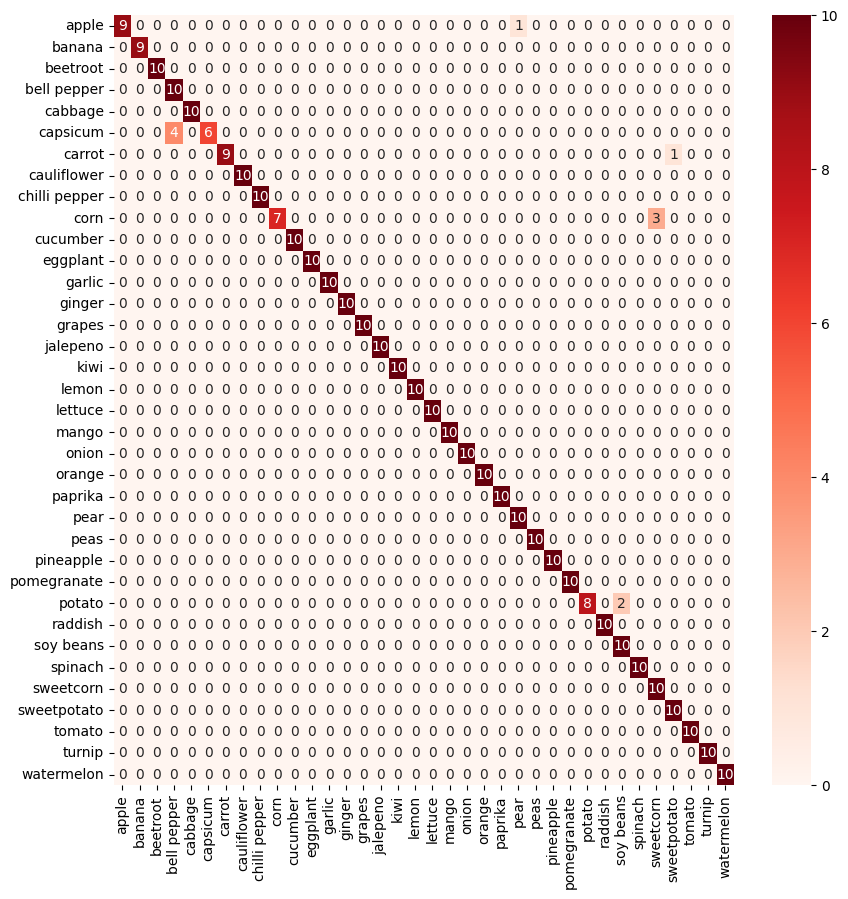

In [ ]:
plt.figure(figsize=(10,10))

sns.heatmap(cm, annot=True, cmap='Reds',
            xticklabels=classes, yticklabels=classes)

<Axes: >

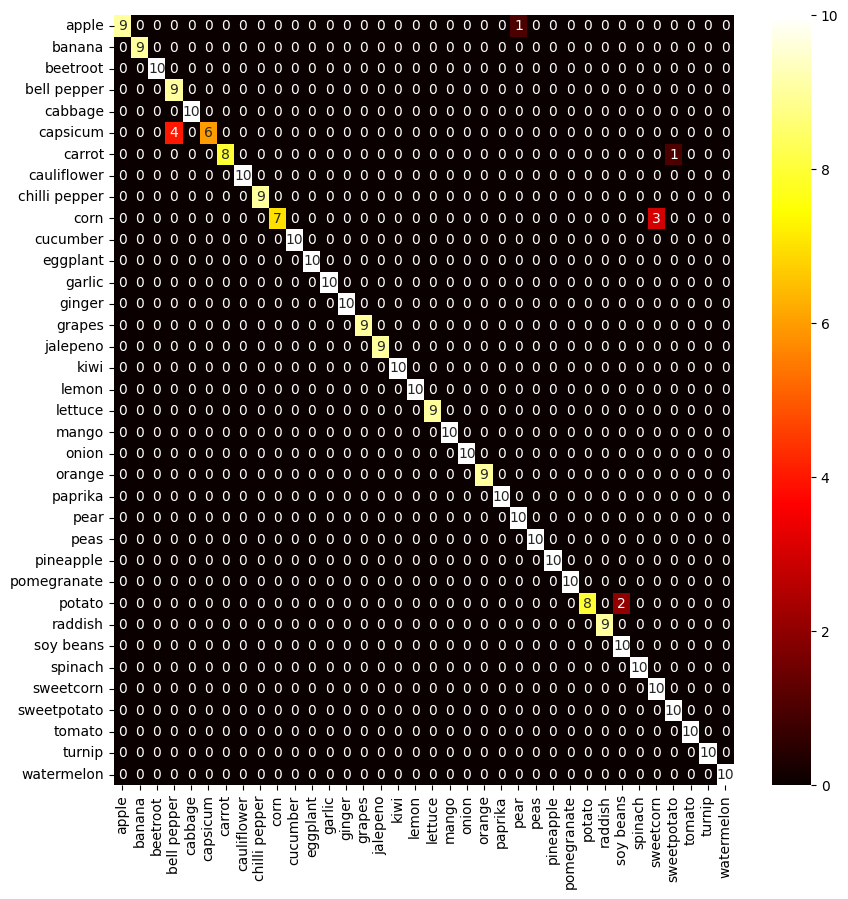

In [ ]:
cm=confusion_matrix(y_true_val, y_pred_val)
plt.figure(figsize=(10,10))
sns.heatmap(cm, annot=True, cmap='hot',
            xticklabels=classes, yticklabels=classes)

<Axes: >

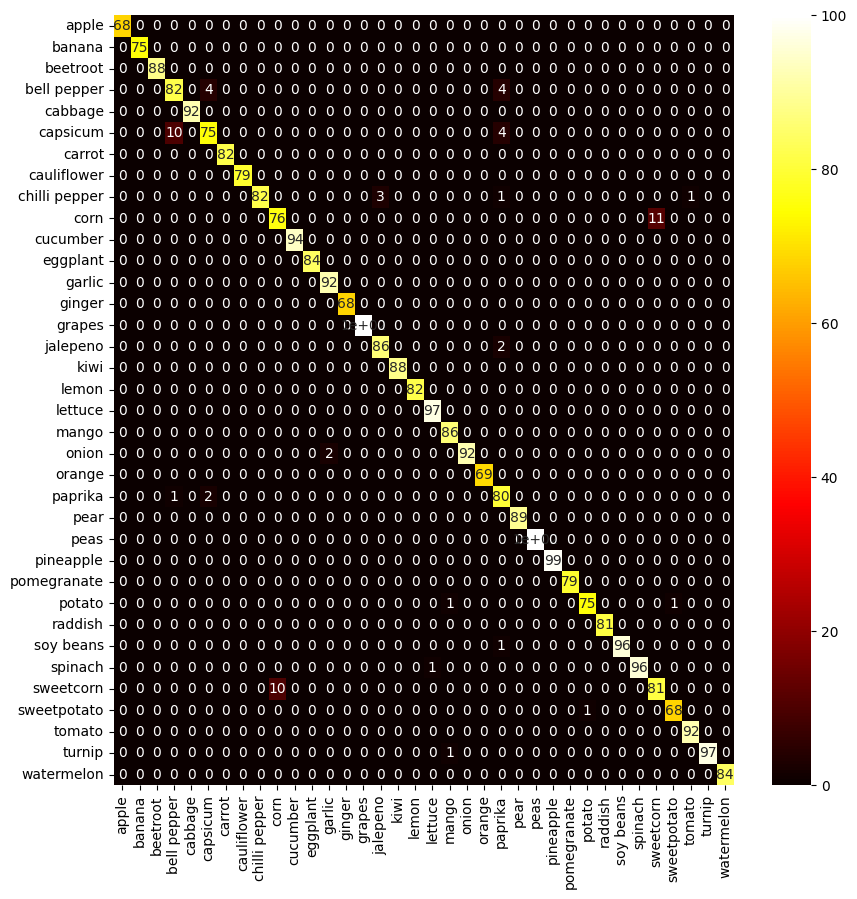

In [ ]:
cm=confusion_matrix(y_true_train, y_pred_train)
plt.figure(figsize=(10,10))

sns.heatmap(cm, annot=True, cmap='hot',
            xticklabels=classes, yticklabels=classes)

In [ ]:
print(classification_report(y_true, y_pred))
print(classification_report(y_true_val, y_pred_val))
print(classification_report(y_true_train, y_pred_train))

              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00        10
           3       0.71      1.00      0.83        10
           4       1.00      1.00      1.00        10
           5       1.00      0.60      0.75        10
           6       1.00      0.90      0.95        10
           7       1.00      1.00      1.00        10
           8       1.00      1.00      1.00        10
           9       1.00      0.70      0.82        10
          10       1.00      1.00      1.00        10
          11       1.00      1.00      1.00        10
          12       1.00      1.00      1.00        10
          13       1.00      1.00      1.00        10
          14       1.00      1.00      1.00        10
          15       1.00      1.00      1.00        10
          16       1.00      1.00      1.00        10
          17       1.00    

In [ ]:
worng_idx=np.where(y_true!=y_pred)[0]

In [ ]:
X = np.concatenate([x for x, y in test], axis=0)

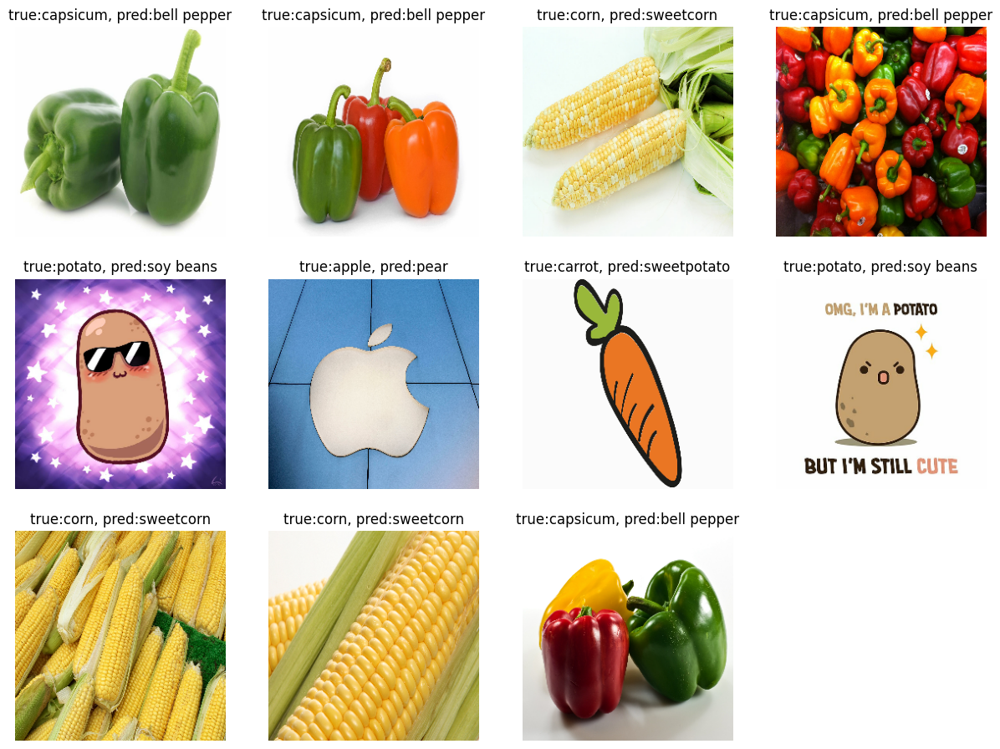

In [ ]:
plt.figure(figsize=(15,15))
for i,idx in  enumerate(worng_idx):
  plt.subplot(int(np.ceil(len(worng_idx)**0.5)),int(np.ceil(len(worng_idx)**0.5)),i+1)
  plt.imshow(X[idx].astype('uint8'))
  plt.title(f'true:{classes[y_true[idx]]}, pred:{classes[y_pred[idx]]}')
  plt.axis('off')

In [ ]:
plot_pred_falses(val, y_pred_val, y_true_val)

# MY_MODEL